# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

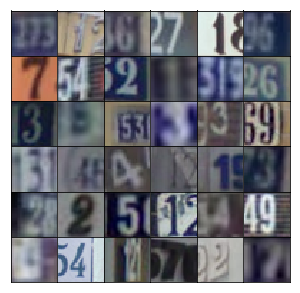

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4 * 4 * 512)
        x = tf.reshape(x, [-1, 4, 4, 512])
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha * x, x)
        # now 4 x 4 x 512
        
        conv1 = tf.layers.conv2d_transpose(x, filters=256, kernel_size=5, strides=2, padding="same")
        conv1 = tf.layers.batch_normalization(conv1, training=training)
        conv1 = tf.maximum(alpha * conv1, conv1)
        # now 8 x 8 x 256
        
        conv2 = tf.layers.conv2d_transpose(conv1, filters=128, kernel_size=5, strides=2, padding="same")
        conv2 = tf.layers.batch_normalization(conv2, training=training)
        conv2 = tf.maximum(alpha * conv2, conv2)
        # now 16 x 16 x 128
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(conv2, filters=output_dim, kernel_size=5, strides=2, padding="same")
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        conv1 = tf.layers.conv2d(x, filters=64, kernel_size=5, strides=2, padding="same")
        conv1 = tf.maximum(alpha * conv1, conv1)
        # now 16 x 16 x 64
        
        conv2 = tf.layers.conv2d(conv1, filters=128, kernel_size=5, strides=2, padding="same")
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = tf.maximum(alpha * conv2, conv2)
        # now 8 x 8 x 128
        
        conv3 = tf.layers.conv2d(conv2, filters=256, kernel_size=5, strides=2, padding="same")
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = tf.maximum(alpha * conv3, conv3)
        # now 4 x 4 x 256
        
        flat = tf.reshape(conv3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=50, show_every=500, figsize=(5,5)):
    saver = tf.train.Saver()

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    sample_z = np.random.uniform(-1, 1, size=(72, z_size))
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [16]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 30
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/30... Discriminator Loss: 0.1756... Generator Loss: 2.5103
Epoch 1/30... Discriminator Loss: 0.2997... Generator Loss: 2.1671
Epoch 1/30... Discriminator Loss: 0.4239... Generator Loss: 2.1035
Epoch 1/30... Discriminator Loss: 1.8747... Generator Loss: 5.5662
Epoch 1/30... Discriminator Loss: 0.6231... Generator Loss: 2.0816
Epoch 1/30... Discriminator Loss: 1.0636... Generator Loss: 2.0618
Epoch 1/30... Discriminator Loss: 0.5503... Generator Loss: 2.2609
Epoch 1/30... Discriminator Loss: 0.4032... Generator Loss: 1.9754
Epoch 1/30... Discriminator Loss: 0.6642... Generator Loss: 2.4600
Epoch 1/30... Discriminator Loss: 1.1267... Generator Loss: 0.8536


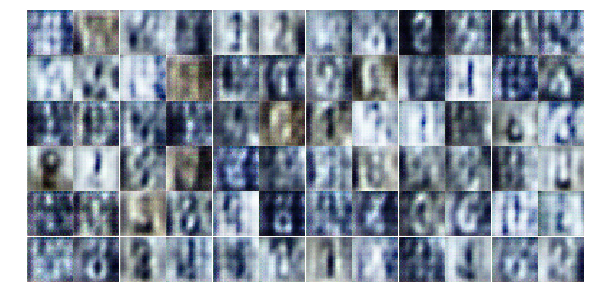

Epoch 1/30... Discriminator Loss: 1.1398... Generator Loss: 0.9167
Epoch 2/30... Discriminator Loss: 0.9594... Generator Loss: 1.0856
Epoch 2/30... Discriminator Loss: 1.0530... Generator Loss: 1.3669
Epoch 2/30... Discriminator Loss: 1.0120... Generator Loss: 0.8617
Epoch 2/30... Discriminator Loss: 0.9057... Generator Loss: 1.6079
Epoch 2/30... Discriminator Loss: 1.0435... Generator Loss: 0.8108
Epoch 2/30... Discriminator Loss: 1.0353... Generator Loss: 1.0887
Epoch 2/30... Discriminator Loss: 1.1860... Generator Loss: 1.0617
Epoch 2/30... Discriminator Loss: 0.9691... Generator Loss: 1.0252
Epoch 2/30... Discriminator Loss: 1.0713... Generator Loss: 1.0741


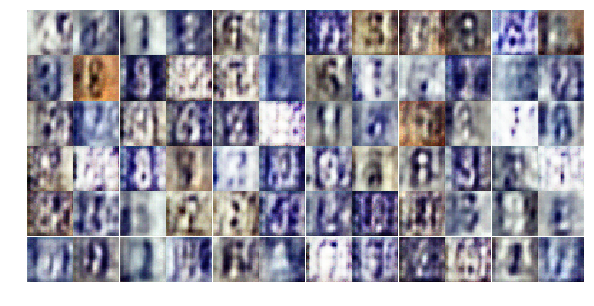

Epoch 2/30... Discriminator Loss: 1.1203... Generator Loss: 0.9733
Epoch 2/30... Discriminator Loss: 1.0047... Generator Loss: 1.1092
Epoch 3/30... Discriminator Loss: 0.9676... Generator Loss: 1.2993
Epoch 3/30... Discriminator Loss: 0.9221... Generator Loss: 1.1541
Epoch 3/30... Discriminator Loss: 0.7041... Generator Loss: 1.1924
Epoch 3/30... Discriminator Loss: 1.1861... Generator Loss: 0.6691
Epoch 3/30... Discriminator Loss: 1.0738... Generator Loss: 0.7817
Epoch 3/30... Discriminator Loss: 0.8534... Generator Loss: 1.0134
Epoch 3/30... Discriminator Loss: 0.9133... Generator Loss: 2.0626
Epoch 3/30... Discriminator Loss: 0.5186... Generator Loss: 1.3533


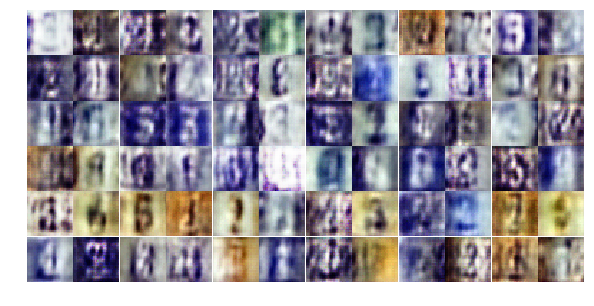

Epoch 3/30... Discriminator Loss: 0.6372... Generator Loss: 1.4991
Epoch 3/30... Discriminator Loss: 0.8870... Generator Loss: 1.8401
Epoch 3/30... Discriminator Loss: 0.5105... Generator Loss: 1.5510
Epoch 3/30... Discriminator Loss: 0.8088... Generator Loss: 1.0780
Epoch 4/30... Discriminator Loss: 0.5748... Generator Loss: 1.5555
Epoch 4/30... Discriminator Loss: 0.4886... Generator Loss: 1.8185
Epoch 4/30... Discriminator Loss: 0.7742... Generator Loss: 2.3736
Epoch 4/30... Discriminator Loss: 0.6215... Generator Loss: 1.5459
Epoch 4/30... Discriminator Loss: 0.4028... Generator Loss: 1.6237
Epoch 4/30... Discriminator Loss: 0.6601... Generator Loss: 1.7682


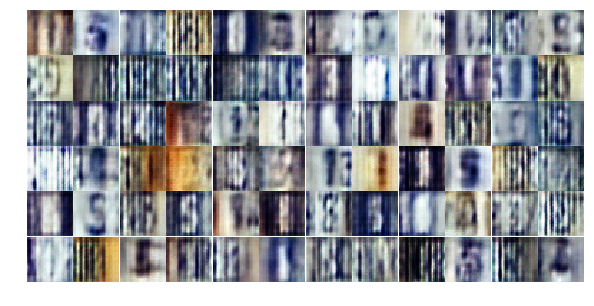

Epoch 4/30... Discriminator Loss: 0.4456... Generator Loss: 2.1662
Epoch 4/30... Discriminator Loss: 0.5568... Generator Loss: 1.2552
Epoch 4/30... Discriminator Loss: 0.4478... Generator Loss: 1.6559
Epoch 4/30... Discriminator Loss: 1.0955... Generator Loss: 0.7073
Epoch 4/30... Discriminator Loss: 0.6620... Generator Loss: 1.1217
Epoch 5/30... Discriminator Loss: 0.4292... Generator Loss: 1.5722
Epoch 5/30... Discriminator Loss: 0.4552... Generator Loss: 1.6767
Epoch 5/30... Discriminator Loss: 0.8908... Generator Loss: 0.8215
Epoch 5/30... Discriminator Loss: 0.7557... Generator Loss: 2.1924
Epoch 5/30... Discriminator Loss: 0.5216... Generator Loss: 1.2777


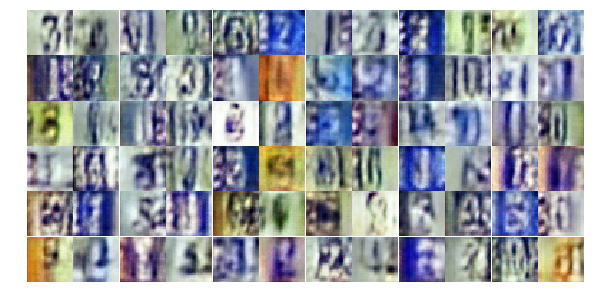

Epoch 5/30... Discriminator Loss: 0.7632... Generator Loss: 0.8532
Epoch 5/30... Discriminator Loss: 0.5322... Generator Loss: 1.4455
Epoch 5/30... Discriminator Loss: 0.6172... Generator Loss: 2.0523
Epoch 5/30... Discriminator Loss: 0.7446... Generator Loss: 0.8900
Epoch 5/30... Discriminator Loss: 0.8568... Generator Loss: 1.0616
Epoch 5/30... Discriminator Loss: 0.6936... Generator Loss: 2.3823
Epoch 5/30... Discriminator Loss: 0.6826... Generator Loss: 1.1067
Epoch 6/30... Discriminator Loss: 0.8641... Generator Loss: 1.8183
Epoch 6/30... Discriminator Loss: 1.0456... Generator Loss: 0.5816
Epoch 6/30... Discriminator Loss: 0.6973... Generator Loss: 1.3786


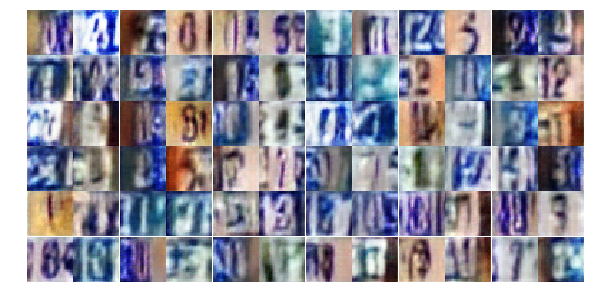

Epoch 6/30... Discriminator Loss: 0.4940... Generator Loss: 1.4552
Epoch 6/30... Discriminator Loss: 0.7293... Generator Loss: 1.0890
Epoch 6/30... Discriminator Loss: 0.4757... Generator Loss: 1.4540
Epoch 6/30... Discriminator Loss: 0.5142... Generator Loss: 1.3064
Epoch 6/30... Discriminator Loss: 0.9036... Generator Loss: 0.7469
Epoch 6/30... Discriminator Loss: 0.7762... Generator Loss: 0.8100
Epoch 6/30... Discriminator Loss: 0.6412... Generator Loss: 1.2731
Epoch 6/30... Discriminator Loss: 1.3405... Generator Loss: 0.4779
Epoch 7/30... Discriminator Loss: 0.8729... Generator Loss: 0.9046
Epoch 7/30... Discriminator Loss: 0.9578... Generator Loss: 1.1014


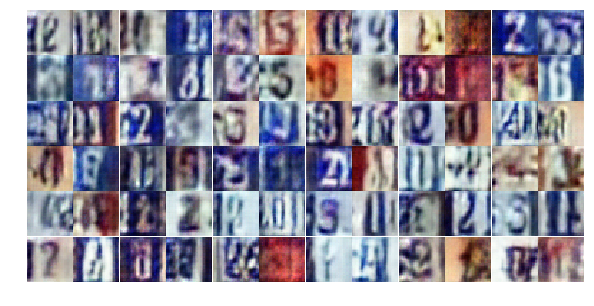

Epoch 7/30... Discriminator Loss: 0.6184... Generator Loss: 1.5834
Epoch 7/30... Discriminator Loss: 0.9063... Generator Loss: 0.6828
Epoch 7/30... Discriminator Loss: 0.5885... Generator Loss: 1.3053
Epoch 7/30... Discriminator Loss: 0.5437... Generator Loss: 1.6065
Epoch 7/30... Discriminator Loss: 0.6875... Generator Loss: 1.4348
Epoch 7/30... Discriminator Loss: 0.6281... Generator Loss: 1.8226
Epoch 7/30... Discriminator Loss: 0.9497... Generator Loss: 0.7933
Epoch 7/30... Discriminator Loss: 0.7953... Generator Loss: 1.3708
Epoch 7/30... Discriminator Loss: 0.4378... Generator Loss: 1.4452
Epoch 7/30... Discriminator Loss: 0.6494... Generator Loss: 1.0730


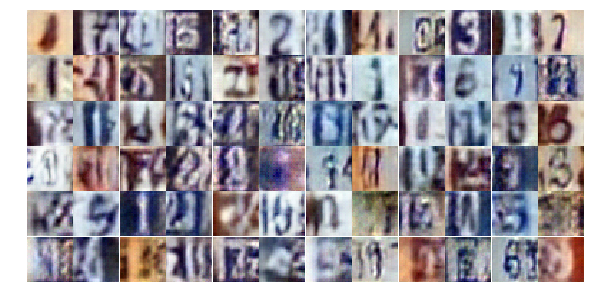

Epoch 8/30... Discriminator Loss: 0.8676... Generator Loss: 0.7461
Epoch 8/30... Discriminator Loss: 0.8409... Generator Loss: 0.7962
Epoch 8/30... Discriminator Loss: 0.8651... Generator Loss: 0.8190
Epoch 8/30... Discriminator Loss: 1.5533... Generator Loss: 0.3198
Epoch 8/30... Discriminator Loss: 0.4237... Generator Loss: 1.5222
Epoch 8/30... Discriminator Loss: 0.6572... Generator Loss: 1.3920
Epoch 8/30... Discriminator Loss: 0.6162... Generator Loss: 2.3413
Epoch 8/30... Discriminator Loss: 0.4820... Generator Loss: 1.4773
Epoch 8/30... Discriminator Loss: 0.8016... Generator Loss: 1.1534
Epoch 8/30... Discriminator Loss: 0.7323... Generator Loss: 3.1192


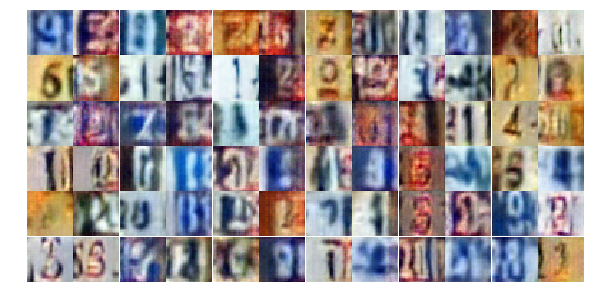

Epoch 8/30... Discriminator Loss: 0.4875... Generator Loss: 1.4092
Epoch 9/30... Discriminator Loss: 0.8309... Generator Loss: 0.9963
Epoch 9/30... Discriminator Loss: 0.9575... Generator Loss: 0.6202
Epoch 9/30... Discriminator Loss: 0.7838... Generator Loss: 0.9659
Epoch 9/30... Discriminator Loss: 0.6685... Generator Loss: 1.2643
Epoch 9/30... Discriminator Loss: 0.7143... Generator Loss: 0.9484
Epoch 9/30... Discriminator Loss: 0.5140... Generator Loss: 2.3199
Epoch 9/30... Discriminator Loss: 0.7072... Generator Loss: 0.8974
Epoch 9/30... Discriminator Loss: 0.5814... Generator Loss: 1.8910
Epoch 9/30... Discriminator Loss: 0.9211... Generator Loss: 0.6933


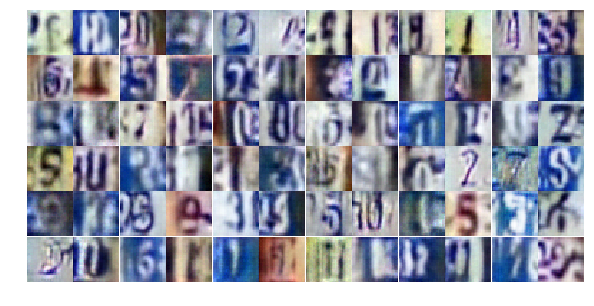

Epoch 9/30... Discriminator Loss: 0.4037... Generator Loss: 1.4731
Epoch 9/30... Discriminator Loss: 0.6494... Generator Loss: 2.4087
Epoch 9/30... Discriminator Loss: 0.9662... Generator Loss: 0.6870
Epoch 10/30... Discriminator Loss: 1.4560... Generator Loss: 0.3992
Epoch 10/30... Discriminator Loss: 0.6425... Generator Loss: 2.0068
Epoch 10/30... Discriminator Loss: 0.7079... Generator Loss: 1.4029
Epoch 10/30... Discriminator Loss: 0.7741... Generator Loss: 2.4497
Epoch 10/30... Discriminator Loss: 0.4232... Generator Loss: 1.7148
Epoch 10/30... Discriminator Loss: 1.5130... Generator Loss: 0.3247
Epoch 10/30... Discriminator Loss: 0.6475... Generator Loss: 1.0738


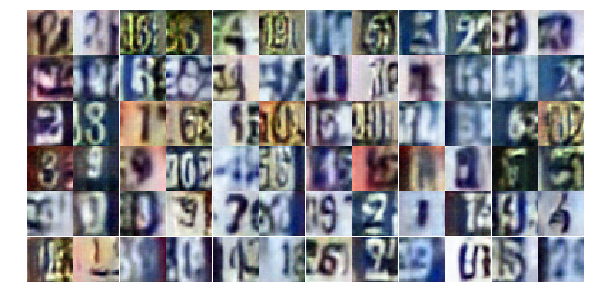

Epoch 10/30... Discriminator Loss: 0.9166... Generator Loss: 0.7320
Epoch 10/30... Discriminator Loss: 0.4145... Generator Loss: 1.8736
Epoch 10/30... Discriminator Loss: 0.3697... Generator Loss: 1.9030
Epoch 10/30... Discriminator Loss: 0.5488... Generator Loss: 2.5239
Epoch 11/30... Discriminator Loss: 0.7646... Generator Loss: 0.9732
Epoch 11/30... Discriminator Loss: 0.9378... Generator Loss: 0.9220
Epoch 11/30... Discriminator Loss: 0.8707... Generator Loss: 0.8128
Epoch 11/30... Discriminator Loss: 1.4799... Generator Loss: 0.3588
Epoch 11/30... Discriminator Loss: 0.4435... Generator Loss: 1.7342
Epoch 11/30... Discriminator Loss: 1.1539... Generator Loss: 0.5263


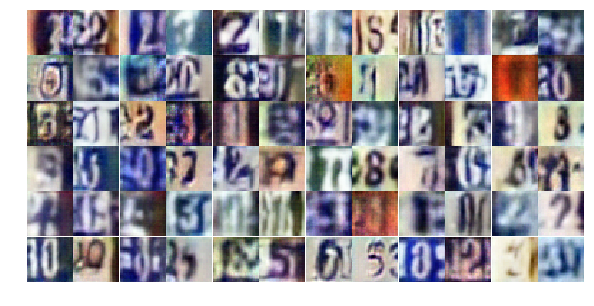

Epoch 11/30... Discriminator Loss: 0.7828... Generator Loss: 0.8593
Epoch 11/30... Discriminator Loss: 1.0866... Generator Loss: 0.5999
Epoch 11/30... Discriminator Loss: 0.7878... Generator Loss: 0.8933
Epoch 11/30... Discriminator Loss: 0.4370... Generator Loss: 1.5490
Epoch 11/30... Discriminator Loss: 1.6501... Generator Loss: 0.3053
Epoch 11/30... Discriminator Loss: 0.6865... Generator Loss: 0.9584
Epoch 12/30... Discriminator Loss: 0.5270... Generator Loss: 1.9757
Epoch 12/30... Discriminator Loss: 1.2582... Generator Loss: 0.4783
Epoch 12/30... Discriminator Loss: 0.5501... Generator Loss: 1.4995
Epoch 12/30... Discriminator Loss: 0.6593... Generator Loss: 1.0992


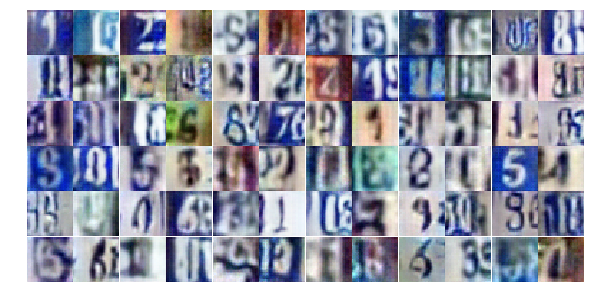

Epoch 12/30... Discriminator Loss: 0.3590... Generator Loss: 2.0222
Epoch 12/30... Discriminator Loss: 0.5039... Generator Loss: 1.3517
Epoch 12/30... Discriminator Loss: 0.8353... Generator Loss: 2.3210
Epoch 12/30... Discriminator Loss: 0.3969... Generator Loss: 1.7515
Epoch 12/30... Discriminator Loss: 0.8426... Generator Loss: 0.7298
Epoch 12/30... Discriminator Loss: 0.7175... Generator Loss: 0.9855
Epoch 12/30... Discriminator Loss: 0.6601... Generator Loss: 1.2025
Epoch 13/30... Discriminator Loss: 0.7062... Generator Loss: 1.1093
Epoch 13/30... Discriminator Loss: 0.6292... Generator Loss: 1.1982
Epoch 13/30... Discriminator Loss: 0.4282... Generator Loss: 1.6275


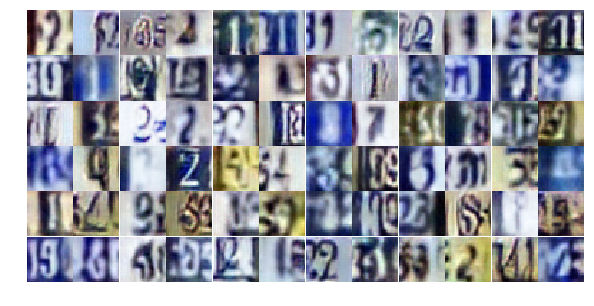

Epoch 13/30... Discriminator Loss: 0.6235... Generator Loss: 1.3404
Epoch 13/30... Discriminator Loss: 1.0487... Generator Loss: 0.6222
Epoch 13/30... Discriminator Loss: 0.9001... Generator Loss: 0.8651
Epoch 13/30... Discriminator Loss: 0.5796... Generator Loss: 1.4908
Epoch 13/30... Discriminator Loss: 0.6079... Generator Loss: 1.2847
Epoch 13/30... Discriminator Loss: 0.8245... Generator Loss: 0.8061
Epoch 13/30... Discriminator Loss: 1.1501... Generator Loss: 0.5083
Epoch 13/30... Discriminator Loss: 0.7929... Generator Loss: 1.0639
Epoch 14/30... Discriminator Loss: 0.8144... Generator Loss: 0.8311
Epoch 14/30... Discriminator Loss: 0.6547... Generator Loss: 1.1247


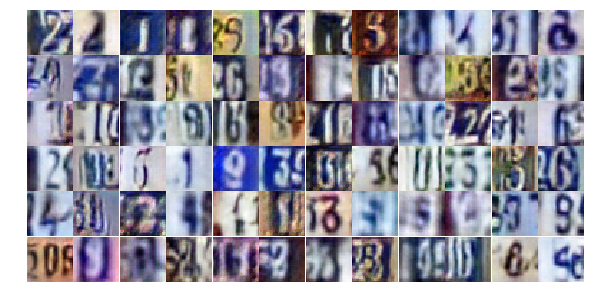

Epoch 14/30... Discriminator Loss: 0.9679... Generator Loss: 0.6108
Epoch 14/30... Discriminator Loss: 1.0368... Generator Loss: 0.6182
Epoch 14/30... Discriminator Loss: 0.8473... Generator Loss: 1.1238
Epoch 14/30... Discriminator Loss: 0.5789... Generator Loss: 1.4313
Epoch 14/30... Discriminator Loss: 0.6997... Generator Loss: 1.2458
Epoch 14/30... Discriminator Loss: 1.2478... Generator Loss: 0.5348
Epoch 14/30... Discriminator Loss: 0.8185... Generator Loss: 0.7974
Epoch 14/30... Discriminator Loss: 1.0956... Generator Loss: 0.6015
Epoch 14/30... Discriminator Loss: 0.6237... Generator Loss: 1.2517
Epoch 14/30... Discriminator Loss: 1.3587... Generator Loss: 0.3983


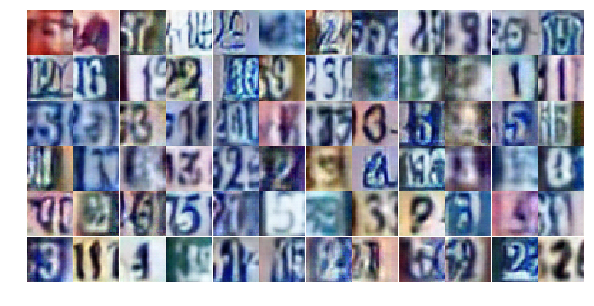

Epoch 15/30... Discriminator Loss: 0.7952... Generator Loss: 0.9352
Epoch 15/30... Discriminator Loss: 0.4736... Generator Loss: 1.4051
Epoch 15/30... Discriminator Loss: 0.7877... Generator Loss: 0.9871
Epoch 15/30... Discriminator Loss: 1.4303... Generator Loss: 0.6832
Epoch 15/30... Discriminator Loss: 0.8984... Generator Loss: 0.8737
Epoch 15/30... Discriminator Loss: 1.5809... Generator Loss: 0.3382
Epoch 15/30... Discriminator Loss: 0.8846... Generator Loss: 0.7140
Epoch 15/30... Discriminator Loss: 0.8958... Generator Loss: 0.7808
Epoch 15/30... Discriminator Loss: 0.5993... Generator Loss: 1.3598
Epoch 15/30... Discriminator Loss: 0.8730... Generator Loss: 1.8646


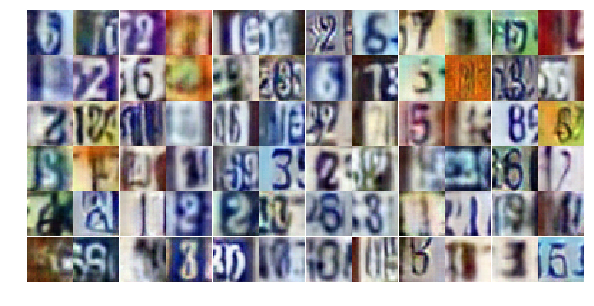

Epoch 15/30... Discriminator Loss: 0.5222... Generator Loss: 1.3074
Epoch 16/30... Discriminator Loss: 1.3399... Generator Loss: 0.4518
Epoch 16/30... Discriminator Loss: 0.5775... Generator Loss: 1.5146
Epoch 16/30... Discriminator Loss: 0.7509... Generator Loss: 0.9009
Epoch 16/30... Discriminator Loss: 0.5874... Generator Loss: 1.2595
Epoch 16/30... Discriminator Loss: 0.8707... Generator Loss: 0.9199
Epoch 16/30... Discriminator Loss: 1.5306... Generator Loss: 0.3524
Epoch 16/30... Discriminator Loss: 0.6047... Generator Loss: 1.1519
Epoch 16/30... Discriminator Loss: 1.1714... Generator Loss: 0.5435
Epoch 16/30... Discriminator Loss: 0.4889... Generator Loss: 1.9866


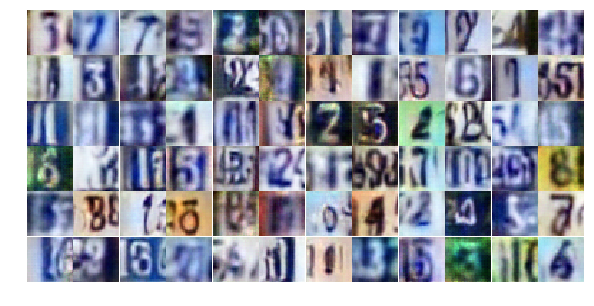

Epoch 16/30... Discriminator Loss: 1.2103... Generator Loss: 0.7887
Epoch 16/30... Discriminator Loss: 0.8647... Generator Loss: 0.7831
Epoch 16/30... Discriminator Loss: 0.6497... Generator Loss: 1.1496
Epoch 17/30... Discriminator Loss: 0.7255... Generator Loss: 1.2205
Epoch 17/30... Discriminator Loss: 0.9896... Generator Loss: 0.6341
Epoch 17/30... Discriminator Loss: 0.6712... Generator Loss: 1.0827
Epoch 17/30... Discriminator Loss: 1.1094... Generator Loss: 0.6595
Epoch 17/30... Discriminator Loss: 0.6245... Generator Loss: 1.0348
Epoch 17/30... Discriminator Loss: 1.4433... Generator Loss: 0.4083
Epoch 17/30... Discriminator Loss: 0.4475... Generator Loss: 1.6710


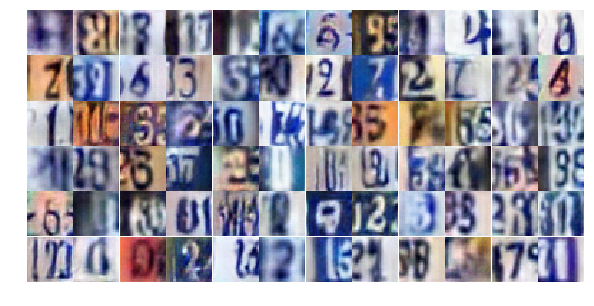

Epoch 17/30... Discriminator Loss: 1.0609... Generator Loss: 0.6431
Epoch 17/30... Discriminator Loss: 0.7932... Generator Loss: 0.8652
Epoch 17/30... Discriminator Loss: 0.9677... Generator Loss: 0.7813
Epoch 17/30... Discriminator Loss: 1.5684... Generator Loss: 0.3185
Epoch 18/30... Discriminator Loss: 1.0935... Generator Loss: 0.5754
Epoch 18/30... Discriminator Loss: 0.9315... Generator Loss: 0.7293
Epoch 18/30... Discriminator Loss: 0.6671... Generator Loss: 1.0862
Epoch 18/30... Discriminator Loss: 0.3637... Generator Loss: 2.0959
Epoch 18/30... Discriminator Loss: 1.1566... Generator Loss: 0.5344
Epoch 18/30... Discriminator Loss: 0.6169... Generator Loss: 1.1845


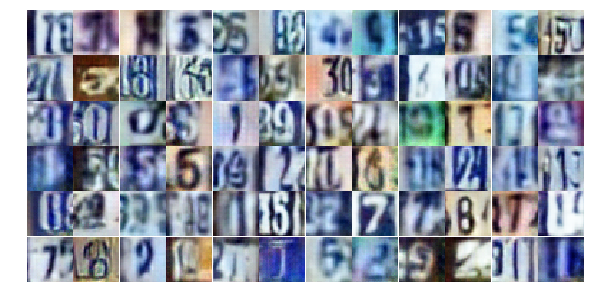

Epoch 18/30... Discriminator Loss: 0.8433... Generator Loss: 0.8050
Epoch 18/30... Discriminator Loss: 0.9322... Generator Loss: 1.0018
Epoch 18/30... Discriminator Loss: 0.8559... Generator Loss: 0.9323
Epoch 18/30... Discriminator Loss: 0.4498... Generator Loss: 1.5668
Epoch 18/30... Discriminator Loss: 0.5790... Generator Loss: 1.1456
Epoch 18/30... Discriminator Loss: 2.7804... Generator Loss: 5.5604
Epoch 19/30... Discriminator Loss: 0.9407... Generator Loss: 0.7828
Epoch 19/30... Discriminator Loss: 0.9682... Generator Loss: 0.7017
Epoch 19/30... Discriminator Loss: 0.8493... Generator Loss: 0.7772
Epoch 19/30... Discriminator Loss: 1.2333... Generator Loss: 0.5908


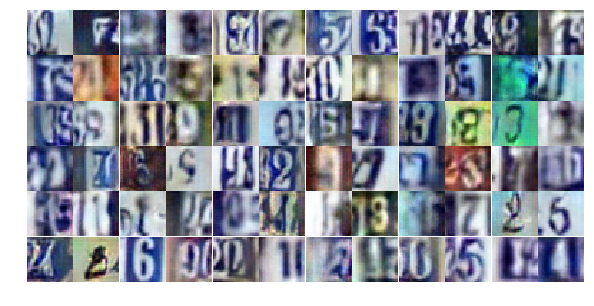

Epoch 19/30... Discriminator Loss: 1.1648... Generator Loss: 0.4831
Epoch 19/30... Discriminator Loss: 0.9538... Generator Loss: 0.7223
Epoch 19/30... Discriminator Loss: 0.7380... Generator Loss: 0.9535
Epoch 19/30... Discriminator Loss: 0.5753... Generator Loss: 1.1792
Epoch 19/30... Discriminator Loss: 0.8320... Generator Loss: 0.8423
Epoch 19/30... Discriminator Loss: 1.1513... Generator Loss: 0.5995
Epoch 19/30... Discriminator Loss: 0.6673... Generator Loss: 1.1862
Epoch 20/30... Discriminator Loss: 0.8160... Generator Loss: 1.0593
Epoch 20/30... Discriminator Loss: 0.6918... Generator Loss: 0.9912
Epoch 20/30... Discriminator Loss: 0.7212... Generator Loss: 0.9815


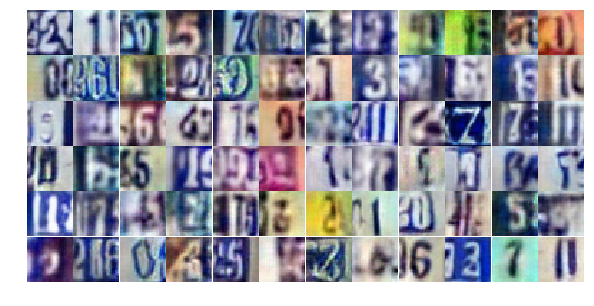

Epoch 20/30... Discriminator Loss: 0.8810... Generator Loss: 0.8024
Epoch 20/30... Discriminator Loss: 1.1866... Generator Loss: 0.5700
Epoch 20/30... Discriminator Loss: 1.0295... Generator Loss: 0.6613
Epoch 20/30... Discriminator Loss: 0.5813... Generator Loss: 1.1061
Epoch 20/30... Discriminator Loss: 0.8916... Generator Loss: 0.8180
Epoch 20/30... Discriminator Loss: 1.0808... Generator Loss: 0.5976
Epoch 20/30... Discriminator Loss: 0.6903... Generator Loss: 1.0430
Epoch 20/30... Discriminator Loss: 0.7904... Generator Loss: 0.8680
Epoch 20/30... Discriminator Loss: 0.8708... Generator Loss: 0.7869
Epoch 21/30... Discriminator Loss: 1.1825... Generator Loss: 0.5159


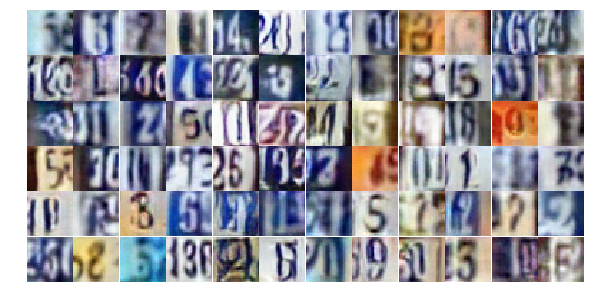

Epoch 21/30... Discriminator Loss: 0.7115... Generator Loss: 0.9786
Epoch 21/30... Discriminator Loss: 0.9341... Generator Loss: 0.7781
Epoch 21/30... Discriminator Loss: 0.7289... Generator Loss: 0.9575
Epoch 21/30... Discriminator Loss: 0.5966... Generator Loss: 1.3541
Epoch 21/30... Discriminator Loss: 0.9812... Generator Loss: 0.7409
Epoch 21/30... Discriminator Loss: 1.5260... Generator Loss: 0.3502
Epoch 21/30... Discriminator Loss: 0.6706... Generator Loss: 1.1146
Epoch 21/30... Discriminator Loss: 0.4333... Generator Loss: 2.1175
Epoch 21/30... Discriminator Loss: 0.4238... Generator Loss: 1.6995
Epoch 21/30... Discriminator Loss: 0.6463... Generator Loss: 1.0448


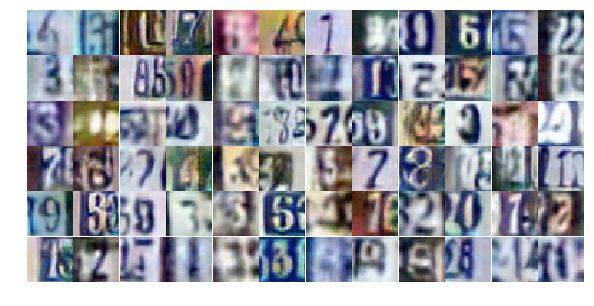

Epoch 22/30... Discriminator Loss: 0.8752... Generator Loss: 1.1860
Epoch 22/30... Discriminator Loss: 1.1019... Generator Loss: 0.6485
Epoch 22/30... Discriminator Loss: 1.1527... Generator Loss: 0.5842
Epoch 22/30... Discriminator Loss: 1.7669... Generator Loss: 0.2661
Epoch 22/30... Discriminator Loss: 0.5974... Generator Loss: 1.1054
Epoch 22/30... Discriminator Loss: 1.1339... Generator Loss: 0.5773
Epoch 22/30... Discriminator Loss: 0.8841... Generator Loss: 0.7274
Epoch 22/30... Discriminator Loss: 1.6562... Generator Loss: 0.3384
Epoch 22/30... Discriminator Loss: 0.4996... Generator Loss: 1.5292
Epoch 22/30... Discriminator Loss: 1.9008... Generator Loss: 0.4053


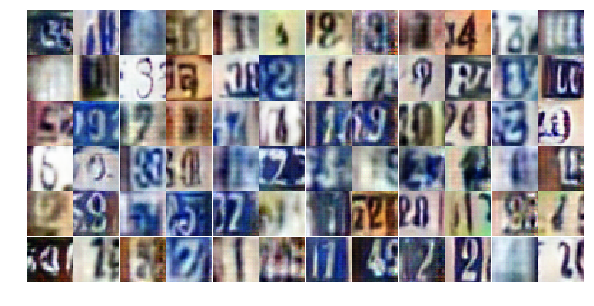

Epoch 22/30... Discriminator Loss: 1.0238... Generator Loss: 0.7972
Epoch 22/30... Discriminator Loss: 1.0509... Generator Loss: 0.6772
Epoch 23/30... Discriminator Loss: 1.0365... Generator Loss: 0.7204
Epoch 23/30... Discriminator Loss: 0.3604... Generator Loss: 2.0194
Epoch 23/30... Discriminator Loss: 0.5309... Generator Loss: 1.5368
Epoch 23/30... Discriminator Loss: 0.9604... Generator Loss: 0.7573
Epoch 23/30... Discriminator Loss: 0.8944... Generator Loss: 0.8349
Epoch 23/30... Discriminator Loss: 0.8635... Generator Loss: 1.5316
Epoch 23/30... Discriminator Loss: 0.8611... Generator Loss: 1.5516
Epoch 23/30... Discriminator Loss: 0.6493... Generator Loss: 1.0402


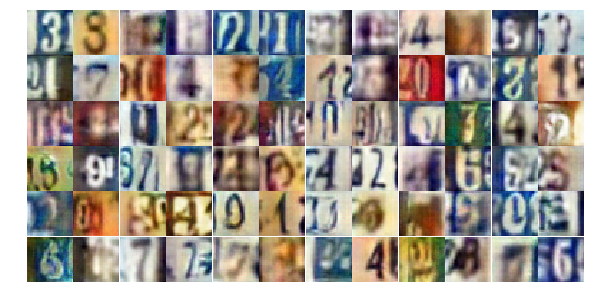

Epoch 23/30... Discriminator Loss: 1.6037... Generator Loss: 0.3808
Epoch 23/30... Discriminator Loss: 0.7679... Generator Loss: 1.0174
Epoch 23/30... Discriminator Loss: 1.5981... Generator Loss: 0.3449
Epoch 24/30... Discriminator Loss: 0.9766... Generator Loss: 1.1262
Epoch 24/30... Discriminator Loss: 0.9939... Generator Loss: 0.6718
Epoch 24/30... Discriminator Loss: 0.5735... Generator Loss: 1.2218
Epoch 24/30... Discriminator Loss: 0.9011... Generator Loss: 3.2085
Epoch 24/30... Discriminator Loss: 1.2071... Generator Loss: 0.4838
Epoch 24/30... Discriminator Loss: 0.6368... Generator Loss: 1.0070
Epoch 24/30... Discriminator Loss: 1.0087... Generator Loss: 0.6442


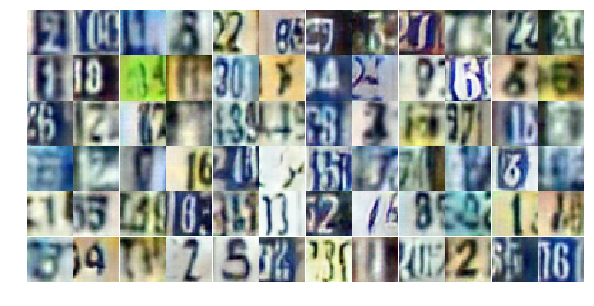

Epoch 24/30... Discriminator Loss: 0.8829... Generator Loss: 0.7998
Epoch 24/30... Discriminator Loss: 0.9399... Generator Loss: 2.9017
Epoch 24/30... Discriminator Loss: 1.3316... Generator Loss: 0.4668
Epoch 24/30... Discriminator Loss: 1.6166... Generator Loss: 0.3355
Epoch 24/30... Discriminator Loss: 1.1519... Generator Loss: 0.5709
Epoch 25/30... Discriminator Loss: 0.7993... Generator Loss: 0.8962
Epoch 25/30... Discriminator Loss: 0.7383... Generator Loss: 1.1602
Epoch 25/30... Discriminator Loss: 0.9259... Generator Loss: 0.6969
Epoch 25/30... Discriminator Loss: 1.1540... Generator Loss: 0.5443
Epoch 25/30... Discriminator Loss: 1.0112... Generator Loss: 0.7161


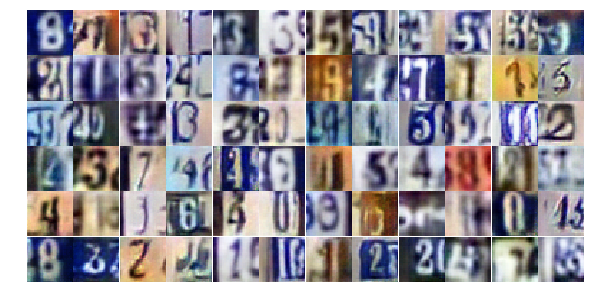

Epoch 25/30... Discriminator Loss: 1.9958... Generator Loss: 0.5218
Epoch 25/30... Discriminator Loss: 1.3267... Generator Loss: 0.6011
Epoch 25/30... Discriminator Loss: 1.2125... Generator Loss: 0.5372
Epoch 25/30... Discriminator Loss: 0.6518... Generator Loss: 1.0881
Epoch 25/30... Discriminator Loss: 1.2532... Generator Loss: 0.5114
Epoch 25/30... Discriminator Loss: 0.9170... Generator Loss: 0.7400
Epoch 26/30... Discriminator Loss: 0.8981... Generator Loss: 0.9891
Epoch 26/30... Discriminator Loss: 1.2458... Generator Loss: 0.5204
Epoch 26/30... Discriminator Loss: 0.6901... Generator Loss: 1.1709
Epoch 26/30... Discriminator Loss: 1.5233... Generator Loss: 1.9741


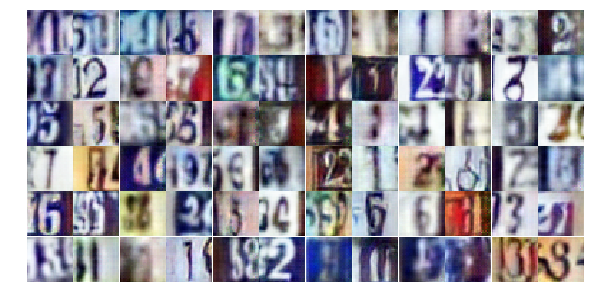

Epoch 26/30... Discriminator Loss: 0.7199... Generator Loss: 1.1251
Epoch 26/30... Discriminator Loss: 0.8378... Generator Loss: 0.7639
Epoch 26/30... Discriminator Loss: 0.9272... Generator Loss: 0.6958
Epoch 26/30... Discriminator Loss: 0.9172... Generator Loss: 0.8377
Epoch 26/30... Discriminator Loss: 1.1573... Generator Loss: 3.1464
Epoch 26/30... Discriminator Loss: 0.6243... Generator Loss: 1.1043
Epoch 26/30... Discriminator Loss: 1.1217... Generator Loss: 0.5592
Epoch 27/30... Discriminator Loss: 0.8232... Generator Loss: 0.8799
Epoch 27/30... Discriminator Loss: 0.3806... Generator Loss: 2.7131
Epoch 27/30... Discriminator Loss: 0.7851... Generator Loss: 1.1026


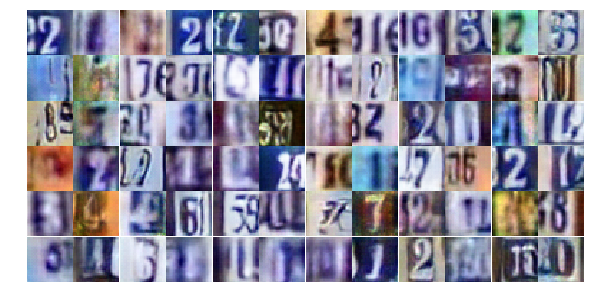

Epoch 27/30... Discriminator Loss: 0.6910... Generator Loss: 1.0801
Epoch 27/30... Discriminator Loss: 0.9375... Generator Loss: 0.8065
Epoch 27/30... Discriminator Loss: 0.4920... Generator Loss: 1.4832
Epoch 27/30... Discriminator Loss: 0.8456... Generator Loss: 0.9135
Epoch 27/30... Discriminator Loss: 0.9809... Generator Loss: 0.8550
Epoch 27/30... Discriminator Loss: 1.2328... Generator Loss: 0.5126
Epoch 27/30... Discriminator Loss: 0.4559... Generator Loss: 1.4676
Epoch 27/30... Discriminator Loss: 1.1860... Generator Loss: 0.5288
Epoch 27/30... Discriminator Loss: 1.5306... Generator Loss: 0.3733
Epoch 28/30... Discriminator Loss: 0.5563... Generator Loss: 1.4779


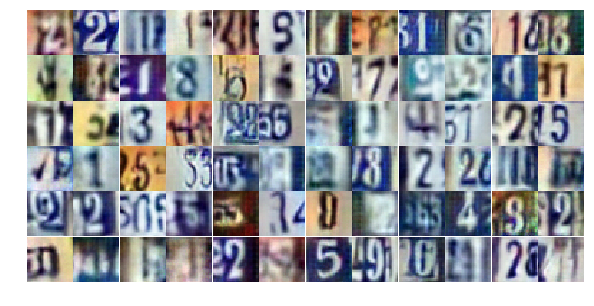

Epoch 28/30... Discriminator Loss: 0.9547... Generator Loss: 0.6391
Epoch 28/30... Discriminator Loss: 0.6405... Generator Loss: 1.1136
Epoch 28/30... Discriminator Loss: 0.9144... Generator Loss: 2.0604
Epoch 28/30... Discriminator Loss: 1.2913... Generator Loss: 0.4809
Epoch 28/30... Discriminator Loss: 0.7500... Generator Loss: 0.9715
Epoch 28/30... Discriminator Loss: 0.7044... Generator Loss: 1.0223
Epoch 28/30... Discriminator Loss: 0.8224... Generator Loss: 0.8843
Epoch 28/30... Discriminator Loss: 1.0083... Generator Loss: 0.7477
Epoch 28/30... Discriminator Loss: 1.0420... Generator Loss: 0.6232
Epoch 28/30... Discriminator Loss: 0.6826... Generator Loss: 1.0595


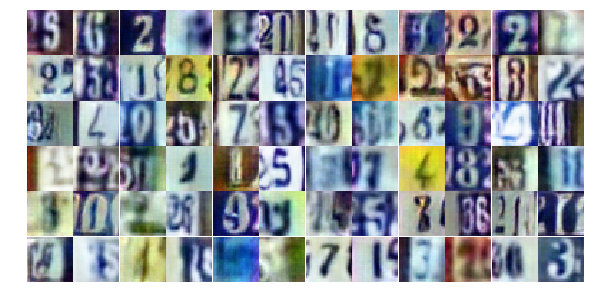

Epoch 29/30... Discriminator Loss: 0.9948... Generator Loss: 0.8851
Epoch 29/30... Discriminator Loss: 0.5609... Generator Loss: 1.3158
Epoch 29/30... Discriminator Loss: 0.6688... Generator Loss: 1.1256
Epoch 29/30... Discriminator Loss: 1.3837... Generator Loss: 0.4861
Epoch 29/30... Discriminator Loss: 1.7958... Generator Loss: 0.2839
Epoch 29/30... Discriminator Loss: 0.6430... Generator Loss: 1.0735
Epoch 29/30... Discriminator Loss: 0.7231... Generator Loss: 0.9360
Epoch 29/30... Discriminator Loss: 0.6950... Generator Loss: 1.5122
Epoch 29/30... Discriminator Loss: 1.1370... Generator Loss: 0.6389
Epoch 29/30... Discriminator Loss: 0.7821... Generator Loss: 0.9261


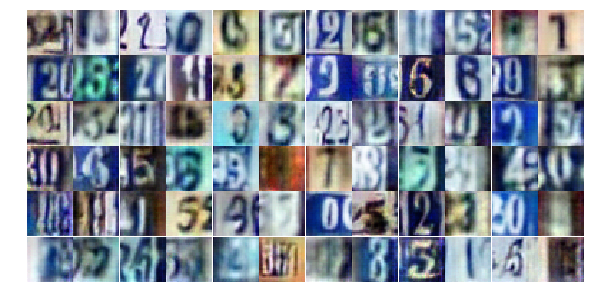

Epoch 29/30... Discriminator Loss: 0.7528... Generator Loss: 1.3201
Epoch 29/30... Discriminator Loss: 1.0001... Generator Loss: 0.6790
Epoch 30/30... Discriminator Loss: 0.7748... Generator Loss: 1.0455
Epoch 30/30... Discriminator Loss: 0.9362... Generator Loss: 0.6829
Epoch 30/30... Discriminator Loss: 1.1172... Generator Loss: 0.6293
Epoch 30/30... Discriminator Loss: 1.6154... Generator Loss: 0.3268
Epoch 30/30... Discriminator Loss: 1.0703... Generator Loss: 0.6386
Epoch 30/30... Discriminator Loss: 0.9562... Generator Loss: 0.7726
Epoch 30/30... Discriminator Loss: 1.1474... Generator Loss: 0.7126
Epoch 30/30... Discriminator Loss: 0.7979... Generator Loss: 1.9707


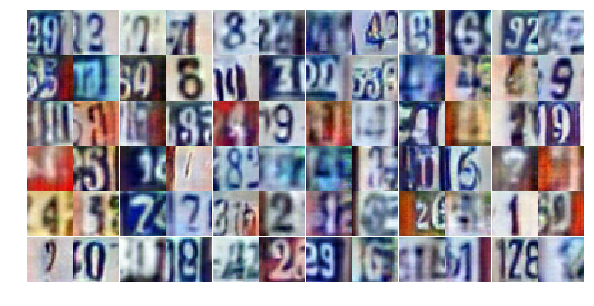

Epoch 30/30... Discriminator Loss: 0.6006... Generator Loss: 1.5252
Epoch 30/30... Discriminator Loss: 0.8981... Generator Loss: 0.7542
Epoch 30/30... Discriminator Loss: 1.1554... Generator Loss: 0.5689


In [17]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

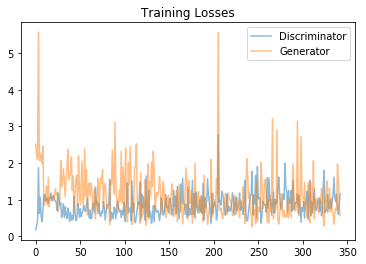

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

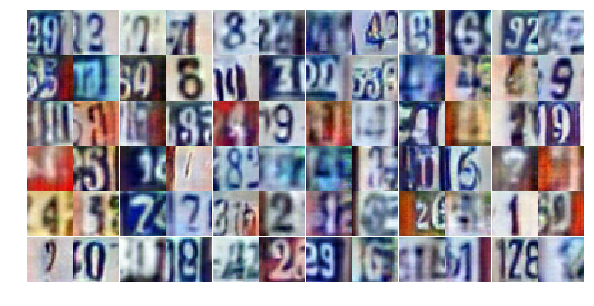

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))